In [3]:
import sys
print(sys.executable)
#python -m pip install torch torchvision torchaudio numpy matplotlib tqdm--force-reinstall --no-cache-dir
#python -m pip install numpy matplotlib tqdm --force-reinstall --no-cache-dir
#!{sys.executable} -m pip install pandas numpy

C:\Users\jzl0375\.conda\envs\diffusion\python.exe


In [1]:
import torch
from torch.utils.data import DataLoader
import pandas as pd
import numpy as np
import glob
import os
from diffuser.utils.training import Trainer
from diffuser.temporal_cond import ConditionalTemporalUnet
from diffuser.diffusion_cond import GaussianDiffusion
from diffuser.utils.dataset import SimpleTrajectoryDataset
def assign_play_ids_per_file(df, start_play_id=0):
    df = df.sort_values("frame").reset_index(drop=True)

    unique_frames = df["frame"].unique()

    frame_jumps = [0]
    for i in range(1, len(unique_frames)):
        if unique_frames[i] - unique_frames[i-1] > 1:
            frame_jumps.append(1)
        else:
            frame_jumps.append(0)

    play_id_map = {}
    play_counter = start_play_id
    for f, jump in zip(unique_frames, frame_jumps):
        if jump == 1:
            play_counter += 1
        play_id_map[f] = play_counter

    df["play_id"] = df["frame"].map(play_id_map)
    return df, play_counter + 1   
os.getcwd()

'C:\\Users\\jzl0375\\Box\\ASI\\Modeling'

In [62]:
base_path = r"C:\Users\jzl0375\Box\ASI\Modeling\dataset"
files = [os.path.join(base_path, f) for f in os.listdir(base_path) if f.endswith(".csv")]

df_list = []
play_offset = 0

for f in files:
    print("Loading:", f)
    df = pd.read_csv(f)
    df, play_offset = assign_play_ids_per_file(df, start_play_id=play_offset)
    df_list.append(df)

df_all = pd.concat(df_list, ignore_index=True)
print("총 플레이 수:", df_all["play_id"].nunique())

Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1585551.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1587604.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1588669.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1588878.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1590050.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1590051.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1590052.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1590053.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1590479.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1595704.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1595705.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1596721.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1596722.csv

C:\Users\jzl0375\AppData\Local\Temp\ipykernel_27692\3694739443.py:9: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(f)


Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1603976.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1604737.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1604738.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1666750.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1667661.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1668542.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1668543.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1670404.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1670500.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1672859.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1682201.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1682931.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1682932.csv

C:\Users\jzl0375\AppData\Local\Temp\ipykernel_27692\3694739443.py:9: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(f)


Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1783371.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1784960.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1785793.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1785794.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1787551.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1788410.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1790032.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1801081.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1801082.csv


C:\Users\jzl0375\AppData\Local\Temp\ipykernel_27692\3694739443.py:9: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(f)


Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1802045.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1804043.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1804044.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1804045.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1804046.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1831516.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1832187.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1833678.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1833679.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1835317.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1836280.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1837091.csv
Loading: C:\Users\jzl0375\Box\ASI\Modeling\dataset\Counterattack_1846146.csv

In [65]:
pid = 2
sample_play = df_all[df_all["play_id"] == pid].copy()
sample_play

,frame,timestamp,period,x,y,player_id,is_detected,ball_data.x,ball_data.y,ball_data.z,ball_data.is_detected,possession.player_id,possession.group,team_side,play_id,flip,x_norm,y_norm,ball_x_norm,ball_y_norm
6666,1663,00:02:38.30,1.0,-14.70,-21.43,151126,True,1.13,-32.97,0.66,True,NaN,away team,away team,2,1.0,-14.70,-21.43,1.13,-32.97
6667,1663,00:02:38.30,1.0,-12.67,-5.15,151095,True,1.13,-32.97,0.66,True,NaN,away team,away team,2,1.0,-12.67,-5.15,1.13,-32.97
6668,1663,00:02:38.30,1.0,-7.64,-32.49,57108,True,1.13,-32.97,0.66,True,NaN,away team,home team,2,1.0,-7.64,-32.49,1.13,-32.97
6669,1663,00:02:38.30,1.0,-21.79,-25.55,154661,False,1.13,-32.97,0.66,True,NaN,away team,home team,2,1.0,-21.79,-25.55,1.13,-32.97
6670,1663,00:02:38.30,1.0,-7.14,-26.18,188184,True,1.13,-32.97,0.66,True,NaN,away team,away team,2,1.0,-7.14,-26.18,1.13,-32.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8883,1763,00:02:48.30,1.0,10.77,0.81,151095,False,14.18,-26.39,0.24,True,62521.0,away team,away team,2,1.0,10.77,0.81,14.18,-26.39
8884,1763,00:02:48.30,1.0,4.07,-23.99,22815,False,14.18,-26.39,0.24,True,62521.0,away team,away team,2,1.0,4.07,-23.99,14.18,-26.39
8885,1763,00:02:48.30,1.0,-30.85,-4.63,22734,False,14.18,-26.39,0.24,True,62521.0,away team,away team,2,1.0,-30.85,-4.63,14.18,-26.39
8886,1763,00:02:48.30,1.0,29.39,-14.42,64021,True,14.18,-26.39,0.24,True,62521.0,away team,away team,2,1.0,29.39,-14.42,14.18,-26.39


In [66]:
save_path = os.path.join(base_path, "counterattack_all.parquet")
df_all.to_parquet(save_path, index=False)


💾 Parquet 저장 완료: C:\Users\jzl0375\Box\ASI\Modeling\dataset\counterattack_all.parquet


In [67]:
df_reload = pd.read_parquet(save_path)
print("📁 Reloaded:", df_reload.shape, " rows")

📁 Reloaded: (31961064, 20)  rows
총 플레이 수: 13412


In [68]:
#df_all.shape
df_all

,frame,timestamp,period,x,y,player_id,is_detected,ball_data.x,ball_data.y,ball_data.z,ball_data.is_detected,possession.player_id,possession.group,team_side,play_id,flip,x_norm,y_norm,ball_x_norm,ball_y_norm
0,205,00:00:12.50,1.0,4.08,5.44,22822,False,-26.92,17.91,0.71,True,NaN,home team,home team,0,-1.0,-4.08,5.44,26.92,17.91
1,205,00:00:12.50,1.0,4.22,-3.80,151605,False,-26.92,17.91,0.71,True,NaN,home team,home team,0,-1.0,-4.22,-3.80,26.92,17.91
2,205,00:00:12.50,1.0,-5.87,17.62,68397,False,-26.92,17.91,0.71,True,NaN,home team,home team,0,-1.0,5.87,17.62,26.92,17.91
3,205,00:00:12.50,1.0,-7.98,-9.64,151111,True,-26.92,17.91,0.71,True,NaN,home team,home team,0,-1.0,7.98,-9.64,26.92,17.91
4,205,00:00:12.50,1.0,37.14,0.75,57092,False,-26.92,17.91,0.71,True,NaN,home team,home team,0,-1.0,-37.14,0.75,26.92,17.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31961059,67600,01:46:51.00,2.0,26.25,-19.76,816481,False,46.37,-6.77,0.48,False,NaN,NaN,away team,13411,1.0,26.25,-19.76,46.37,-6.77
31961060,67600,01:46:51.00,2.0,15.58,-23.70,57144,False,46.37,-6.77,0.48,False,NaN,NaN,away team,13411,1.0,15.58,-23.70,46.37,-6.77
31961061,67600,01:46:51.00,2.0,9.31,0.18,151137,False,46.37,-6.77,0.48,False,NaN,NaN,away team,13411,1.0,9.31,0.18,46.37,-6.77
31961062,67600,01:46:51.00,2.0,6.24,-9.03,52566,False,46.37,-6.77,0.48,False,NaN,NaN,away team,13411,1.0,6.24,-9.03,46.37,-6.77


In [69]:
def filter_plays_by_ball_position(df_all, x_min=0, x_max=20):

    first_frames = df_all.loc[df_all.groupby("play_id")["frame"].idxmin()]


    valid_pids = first_frames[
        (first_frames["ball_x_norm"] >= x_min) &
        (first_frames["ball_x_norm"] <= x_max)
    ]["play_id"].unique()

    print(f"조건 만족 play 수: {len(valid_pids)} / 전체 {df_all.play_id.nunique()}")

    # 원본 df에서 valid play만 유지
    return df_all[df_all["play_id"].isin(valid_pids)].copy()
df_filtered = filter_plays_by_ball_position(df_all, x_min=0, x_max=20)

조건 만족 play 수: 5739 / 전체 13412


In [73]:
def sort_play_by_quadrants_no_ball(play_df):
    f0 = play_df["frame"].min()
    first = play_df[play_df["frame"] == f0].copy()


    first = first[first["player_id"].notna()].copy()


    poss_team = first["possession.group"].iloc[0]


    att = first[first["team_side"] == poss_team].copy()
    defn = first[first["team_side"] != poss_team].copy()


    att_center_x = att["x_norm"].mean()
    att_center_y = att["y_norm"].mean()

    def_center_x = defn["x_norm"].mean()
    def_center_y = defn["y_norm"].mean()


    def split_quadrants(df, cx, cy):
        q1 = df[(df["y_norm"] <  cy) & (df["x_norm"] <  cx)]   # Left-Back
        q2 = df[(df["y_norm"] <  cy) & (df["x_norm"] >= cx)]   # Left-Front
        q3 = df[(df["y_norm"] >= cy) & (df["x_norm"] <  cx)]   # Right-Back
        q4 = df[(df["y_norm"] >= cy) & (df["x_norm"] >= cx)]   # Right-Front


        q1 = q1.sort_values(["x_norm", "y_norm"])
        q2 = q2.sort_values(["x_norm", "y_norm"])
        q3 = q3.sort_values(["x_norm", "y_norm"])
        q4 = q4.sort_values(["x_norm", "y_norm"])

        return pd.concat([q1, q2, q3, q4], ignore_index=False)


    att_sorted = split_quadrants(att,  att_center_x,  att_center_y)
    def_sorted = split_quadrants(defn, def_center_x, def_center_y)


    index_map = {}
    idx = 0
    for pid in att_sorted["player_id"]:
        index_map[pid] = idx
        idx += 1

    for pid in def_sorted["player_id"]:
        index_map[pid] = idx
        idx += 1


    final = play_df.copy()
    final["entity_index"] = -1


    mask_players = final["player_id"].notna()
    final = final[mask_players].copy()

    for pid, ix in index_map.items():
        final.loc[final["player_id"] == pid, "entity_index"] = ix


    final = final.sort_values(["frame", "entity_index"]).reset_index(drop=True)

    return final


In [74]:
def quadrant_sort_all_plays_no_ball(df_all):
    out = []
    play_ids = df_all["play_id"].unique()

    for i, pid in enumerate(play_ids, start=1):
        print(f"[Quadrant sorting] play {i}/{len(play_ids)} (pid={pid})")

        play = df_all[df_all["play_id"] == pid].copy()
        sorted_play = sort_play_by_quadrants_no_ball(play)
        out.append(sorted_play)

    return pd.concat(out, ignore_index=True)


In [75]:
df_sorted = quadrant_sort_all_plays_no_ball(df_filtered)


[Quadrant sorting] play 1/5739 (pid=2)
[Quadrant sorting] play 2/5739 (pid=3)
[Quadrant sorting] play 3/5739 (pid=4)
[Quadrant sorting] play 4/5739 (pid=5)
[Quadrant sorting] play 5/5739 (pid=6)
[Quadrant sorting] play 6/5739 (pid=7)
[Quadrant sorting] play 7/5739 (pid=10)
[Quadrant sorting] play 8/5739 (pid=13)
[Quadrant sorting] play 9/5739 (pid=16)
[Quadrant sorting] play 10/5739 (pid=17)
[Quadrant sorting] play 11/5739 (pid=21)
[Quadrant sorting] play 12/5739 (pid=22)
[Quadrant sorting] play 13/5739 (pid=26)
[Quadrant sorting] play 14/5739 (pid=31)
[Quadrant sorting] play 15/5739 (pid=32)
[Quadrant sorting] play 16/5739 (pid=36)
[Quadrant sorting] play 17/5739 (pid=39)
[Quadrant sorting] play 18/5739 (pid=47)
[Quadrant sorting] play 19/5739 (pid=53)
[Quadrant sorting] play 20/5739 (pid=54)
[Quadrant sorting] play 21/5739 (pid=55)
[Quadrant sorting] play 22/5739 (pid=56)
[Quadrant sorting] play 23/5739 (pid=57)
[Quadrant sorting] play 24/5739 (pid=60)
[Quadrant sorting] play 25/5739

In [77]:
df_sorted.head(22)

,frame,timestamp,period,x,y,player_id,is_detected,ball_data.x,ball_data.y,ball_data.z,...,possession.player_id,possession.group,team_side,play_id,flip,x_norm,y_norm,ball_x_norm,ball_y_norm,entity_index
0,1663,00:02:38.30,1.0,-25.93,-29.99,22815,False,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-25.93,-29.99,1.13,-32.97,0
1,1663,00:02:38.30,1.0,-14.70,-21.43,151126,True,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-14.70,-21.43,1.13,-32.97,1
2,1663,00:02:38.30,1.0,-13.12,-33.79,62521,True,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-13.12,-33.79,1.13,-32.97,2
3,1663,00:02:38.30,1.0,-7.14,-26.18,188184,True,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-7.14,-26.18,1.13,-32.97,3
4,1663,00:02:38.30,1.0,-3.52,-32.87,818935,True,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-3.52,-32.87,1.13,-32.97,4
5,1663,00:02:38.30,1.0,1.74,-32.08,22565,True,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,1.74,-32.08,1.13,-32.97,5
6,1663,00:02:38.30,1.0,7.58,-24.52,64021,False,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,7.58,-24.52,1.13,-32.97,6
7,1663,00:02:38.30,1.0,-44.02,-6.32,22734,False,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-44.02,-6.32,1.13,-32.97,7
8,1663,00:02:38.30,1.0,-22.70,-9.56,143907,True,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-22.70,-9.56,1.13,-32.97,8
9,1663,00:02:38.30,1.0,-12.67,-5.15,151095,True,1.13,-32.97,0.66,...,NaN,away team,away team,2,1.0,-12.67,-5.15,1.13,-32.97,9


In [78]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_play(plays_combined_df, play_idx):
    play_df = plays_combined_df[plays_combined_df["play_id"] == play_idx].copy()
    play_df = play_df.sort_values("frame")

    frames = sorted(play_df["frame"].unique())
    horizon = len(frames)
    
    first_f = frames[0]
    first_slice = play_df[play_df["frame"] == first_f]
    first_possession = first_slice["possession.group"].iloc[0]
    

    home_ids = sorted(play_df[play_df["team_side"]=="home team"]["player_id"].unique())
    away_ids = sorted(play_df[play_df["team_side"]=="away team"]["player_id"].unique())

    n_home = len(home_ids)
    n_away = len(away_ids)
    n_players = n_home + n_away

    gt = np.zeros((horizon, n_players + 1, 2))

    for i, f in enumerate(frames):
        slice_f = play_df[play_df["frame"] == f]

        for idx, pid in enumerate(home_ids):
            tmp = slice_f[slice_f["player_id"] == pid]
            if len(tmp) > 0:
                gt[i, idx] = [tmp["x_norm"].iloc[0], tmp["y_norm"].iloc[0]]

        for idx, pid in enumerate(away_ids):
            tmp = slice_f[slice_f["player_id"] == pid]
            if len(tmp) > 0:
                gt[i, n_home + idx] = [tmp["x_norm"].iloc[0], tmp["y_norm"].iloc[0]]

        bx = slice_f["ball_x_norm"].iloc[0]
        by = slice_f["ball_y_norm"].iloc[0]
        gt[i, -1] = [bx, by]

    print("GT Shape:", gt.shape)

    fig, ax = plt.subplots(figsize=(7, 6))
    ax.set_xlim(-5, 65)
    ax.set_ylim(-50, 50)

    attackers, = ax.plot([], [], 'o', color='red', label='Home')
    defenders, = ax.plot([], [], 'o', color='blue', label='Away')
    ball, = ax.plot([], [], '*', color='green', markersize=12, label='Ball')
    ax.legend()

    def init_anim():
        attackers.set_data([], [])
        defenders.set_data([], [])
        ball.set_data([], [])
        return attackers, defenders, ball

    def update_anim(t):
        frame = gt[t]

        home_xy = frame[:n_home]
        away_xy = frame[n_home:n_home+n_away]
        ball_xy = frame[-1]

        attackers.set_data(home_xy[:,0], home_xy[:,1])
        defenders.set_data(away_xy[:,0], away_xy[:,1])
        ball.set_data([ball_xy[0]], [ball_xy[1]])

        ax.set_title(f"Play {play_idx} | Frame {t+1}/{horizon}")
        return attackers, defenders, ball

    ani = FuncAnimation(
        fig, update_anim,
        frames=horizon,
        init_func=init_anim,
        interval=120,
        blit=True
    )

    return HTML(ani.to_jshtml())

선택한 플레이 프레임 수: 101 | 첫 프레임 포제션: away team
GT Shape: (101, 23, 2)


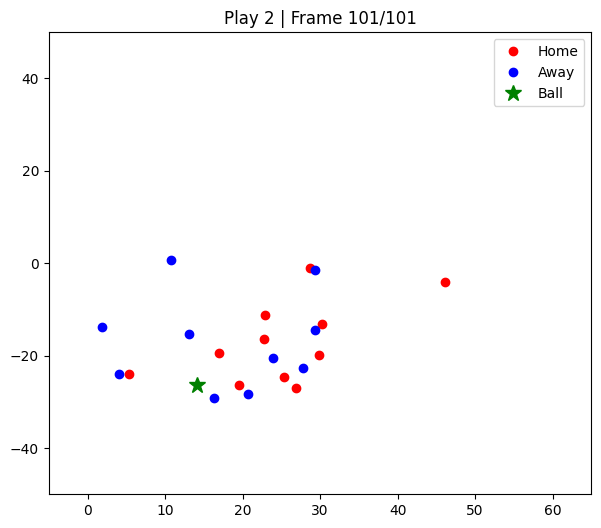

In [79]:
animate_play(df_sorted, play_idx=2)

In [80]:
df_sorted.head(22)
frame_count_per_play = df_sorted.groupby('play_id')['frame'].nunique()
print(frame_count_per_play)

play_id
2        101
3        101
4        101
5        202
6        101
        ... 
13386    101
13388    101
13392    101
13395    180
13401    101
Name: frame, Length: 5739, dtype: int64


In [81]:
from tqdm.auto import tqdm
import torch
import numpy as np

def make_trajectories_with_ball(df_sorted):

    trajectories = []
    play_ids = df_sorted["play_id"].unique()

    print(f"총 {len(play_ids)}개의 play trajectory 생성 시작...\n")

    for pid in tqdm(play_ids, desc="Generating trajectories", ascii=True, dynamic_ncols=True):

        sub = df_sorted[df_sorted.play_id == pid].copy()

        players = sub[["x_norm", "y_norm"]].to_numpy()
        T = sub["frame"].nunique()

        players_per_frame = players.shape[0] // T

        players = players.reshape(T, players_per_frame, 2)

        ball = (
            sub.groupby("frame")[["ball_x_norm", "ball_y_norm"]]
            .mean()
            .to_numpy()
            .reshape(T, 1, 2)
        )

        traj = np.concatenate([players, ball], axis=1)

        trajectories.append(torch.tensor(traj, dtype=torch.float32))

    print(f" trajectory shape = {trajectories[0].shape}")
    return trajectories

trajectories = make_trajectories_with_ball(df_sorted)

C:\Users\jzl0375\.conda\envs\diffusion\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


총 5739개의 play trajectory 생성 시작...



Generating trajectories: 100%|#####################################################| 5739/5739 [01:16<00:00, 75.16it/s]


🎉 모든 trajectory 변환 완료!
예시 trajectory shape = torch.Size([101, 23, 2])


In [82]:
save_path = os.path.join(base_path, "trajectories_strict.pt")
torch.save(trajectories, save_path)

💾 저장 완료: C:\Users\jzl0375\Box\ASI\Modeling\dataset\trajectories_strict.pt


In [2]:
base_path = r"C:\Users\jzl0375\Box\ASI\Modeling\dataset"
save_path = os.path.join(base_path, "trajectories_strict.pt")
trajectories = torch.load(save_path, weights_only=False)
print(type(trajectories), len(trajectories))

<class 'list'> 5739


In [27]:
lengths = [t.shape[0] for t in trajectories]
print("min frames:", min(lengths))
print("max frames:", max(lengths))

min frames: 2
max frames: 404


In [3]:

device = 'cuda' if torch.cuda.is_available() else 'cpu'
observed_frames = 20
horizon = 100              
batch_size = 64

n_teamA = 11
n_teamB = 11
n_ball = 1
n_players = n_teamA + n_teamB + n_ball
feature_dim = n_players * 2
timesteps = 200


trajectories = [t for t in trajectories if t.shape[1] == 23]


valid_trajs = [t[:100] for t in trajectories if t.shape[0] >= 100]


if len(valid_trajs) == 0:
    raise ValueError("No 100 frames trajectory.")

# --------------------------------
# 3. 텐서로 합치기
# --------------------------------
x_tensor = torch.stack(valid_trajs, dim=0)      # [B, 100, 23, 2]
print("x_tensor shape:", x_tensor.shape)

# --------------------------------
# 4. [B, T, 46]로 reshape
# --------------------------------
B = x_tensor.size(0)
x_data = x_tensor.reshape(B, horizon, -1)        # [B, 100, 46]
print("x_data shape:", x_data.shape)


23개 객체 유지한 플레이 수: 5537
앞 100프레임으로 자른 플레이 수: 5377
x_tensor shape: torch.Size([5377, 100, 23, 2])
x_data shape: torch.Size([5377, 100, 46])


In [86]:
print(x_data[0].shape)  # 첫 play의 shape 예시 (예: torch.Size([T, 23, 2]))

torch.Size([100, 46])


🎥 Visualizing play #81 | shape = torch.Size([100, 46])


C:\Users\jzl0375\AppData\Local\Temp\ipykernel_31364\1438289717.py:59: UserWarning: Glyph 9917 (\N{SOCCER BALL}) missing from font(s) DejaVu Sans.
  ani = FuncAnimation(fig, update_anim, frames=horizon,


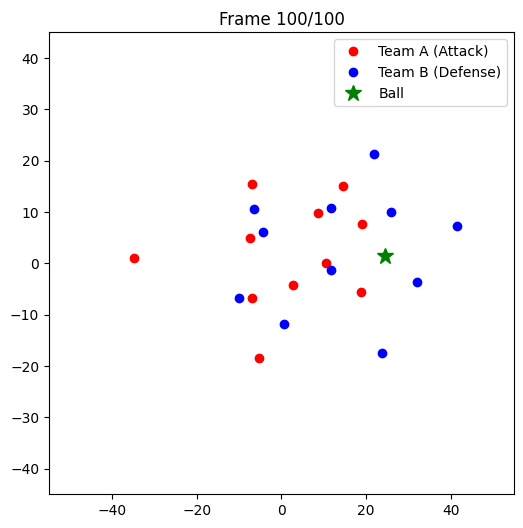

In [19]:
from IPython.display import HTML
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

batch_idx = 81  
gt = x_data[batch_idx]  # [horizon, feature_dim]
print(f"🎥 Visualizing play #{batch_idx} | shape = {gt.shape}")


fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-55, 55) 
ax.set_ylim(-45, 45)
ax.set_title("⚽ Synthetic Soccer Trajectories")


teamA_color = 'red'     
teamB_color = 'blue'    
ball_color = 'green'   

attackers, = ax.plot([], [], 'o', color=teamA_color, label='Team A (Attack)')
defenders, = ax.plot([], [], 'o', color=teamB_color, label='Team B (Defense)')
ball, = ax.plot([], [], '*', color=ball_color, markersize=12, label='Ball')
ax.legend()


def init_anim():
    attackers.set_data([], [])
    defenders.set_data([], [])
    ball.set_data([], [])
    return attackers, defenders, ball

def update_anim(frame):
    data = gt[frame].reshape(n_players, 2)

    teamA_xy = data[:n_teamA]
    teamB_xy = data[n_teamA:n_teamA + n_teamB]
    ball_xy = data[-1]

    attackers.set_data(teamA_xy[:, 0], teamA_xy[:, 1])
    defenders.set_data(teamB_xy[:, 0], teamB_xy[:, 1])
    ball.set_data([ball_xy[0].item()], [ball_xy[1].item()]) 

    ax.set_title(f"Frame {frame + 1}/{horizon}")
    return attackers, defenders, ball


ani = FuncAnimation(fig, update_anim, frames=horizon,
                    init_func=init_anim, interval=150, blit=True)

HTML(ani.to_jshtml())

In [4]:


class GaussianNormalizer:
    def __init__(self, X):
        self.means = X.mean(dim=0, keepdim=True)
        self.stds  = X.std(dim=0, keepdim=True) + 1e-6

    def normalize(self, x):
        return (x - self.means) / self.stds

    def unnormalize(self, x):
        return x * self.stds + self.means




# x_data: [B, T, F_pos]
delta = x_data[:, 1:, :] - x_data[:, :-1, :]
zero_pad = torch.zeros_like(delta[:, :1, :])
delta = torch.cat([zero_pad, delta], dim=1)   # [B, T, F_pos]

B, T, F = x_data.shape


# =========================================================
# 2) Gaussian Normalization 
# =========================================================

pos_flat   = x_data.reshape(B*T, F)
delta_flat = delta.reshape(B*T, F)

pos_norm   = GaussianNormalizer(pos_flat)
delta_norm = GaussianNormalizer(delta_flat)

x_data_norm  = pos_norm.normalize(pos_flat).reshape(B, T, F)
delta_normed = delta_norm.normalize(delta_flat).reshape(B, T, F)


# =========================================================
# 3) normalized [pos, delta] 
# =========================================================

x_combined = torch.cat([x_data_norm, delta_normed], dim=-1)  # [B, T, 2F]
transition_dim = x_combined.shape[-1]
obs_dim = feature_dim
action_dim = feature_dim

pos_dim = F
delta_dim = F
total_dim = pos_dim + delta_dim   # = 2F


teamA_idx = torch.arange(0, n_teamA * 2)  
teamB_idx = torch.arange(n_teamA * 2, (n_teamA + n_teamB) * 2)
ball_idx  = torch.arange((n_teamA + n_teamB) * 2, pos_dim)

delta_teamA_idx = teamA_idx + pos_dim
delta_teamB_idx = teamB_idx + pos_dim
delta_ball_idx  = ball_idx  + pos_dim



cond_tensor = torch.zeros_like(x_combined)   # [B, T, 2F]

for t in range(horizon):

    if t < observed_frames:
        cond_tensor[:, t, :] = x_combined[:, t, :]

    else:
        cond_tensor[:, t, teamA_idx]       = x_combined[:, t, teamA_idx]
        cond_tensor[:, t, delta_teamA_idx] = x_combined[:, t, delta_teamA_idx]

        cond_tensor[:, t, ball_idx]        = x_combined[:, t, ball_idx]
        cond_tensor[:, t, delta_ball_idx]  = x_combined[:, t, delta_ball_idx]


cond_mask = torch.zeros((B, total_dim, horizon), device=device)

for t in range(horizon):

    if t < observed_frames:
        cond_mask[:, :, t] = 1.0

    else:
        cond_mask[:, teamA_idx,       t] = 1
        cond_mask[:, delta_teamA_idx, t] = 1

        # -------------------------------------------------
        # 볼 pos + delta = cond → mask=1
        # -------------------------------------------------
        cond_mask[:, ball_idx,        t] = 1
        cond_mask[:, delta_ball_idx,  t] = 1


In [89]:
print(cond_tensor.shape)
print(x_combined.shape)


torch.Size([5377, 100, 92])
torch.Size([5377, 100, 92])


In [5]:

print("\nInitializing diffusion model...")

# -------------------------------
# (1) UNet backbone
# -------------------------------
unet = ConditionalTemporalUnet(
    horizon=horizon,
    transition_dim=transition_dim,  # pos + delta
    dim=32,
    dim_mults=(1, 2, 4),
    attention=True
).to(device)

# -------------------------------
# (2) Gaussian Diffusion wrapper
# -------------------------------
diffusion = GaussianDiffusion(
    model=unet,
    horizon=horizon,
    observation_dim=obs_dim,
    action_dim=action_dim,
    n_timesteps=timesteps,
    loss_type='l1',
    clip_denoised=True,
    predict_epsilon=True,
    device=device         
)

dataset = SimpleTrajectoryDataset(x_combined, cond_tensor, cond_mask)

trainer = Trainer(
    diffusion_model=diffusion,
    dataset=dataset,
    renderer=None,               
    train_batch_size=batch_size,  
    train_lr=1e-4,
    gradient_accumulate_every=1,   
    ema_decay=0.995,
    save_freq=100,
    results_folder="./results",
    device=device
)


Initializing diffusion model...


In [6]:
print("x_combined :", x_combined.shape)
print("cond_tensor:", cond_tensor.shape)
print("cond_mask  :", cond_mask.shape)

x_combined : torch.Size([5377, 100, 92])
cond_tensor: torch.Size([5377, 100, 92])
cond_mask  : torch.Size([5377, 92, 100])


In [7]:
def build_sampling_conditions(
    x_combined,          # [B, T, 2F] normalized pos+delta
    observed_frames,     
    teamA_idx,
    teamB_idx,
    ball_idx,
    pos_dim,
    device="cuda"
):
    B, T, D = x_combined.shape
    
    delta_teamA_idx = teamA_idx + pos_dim
    delta_teamB_idx = teamB_idx + pos_dim
    delta_ball_idx  = ball_idx  + pos_dim

    cond_tensor = torch.zeros_like(x_combined)   # [B, T, 2F]
    cond_mask   = torch.zeros((B, D, T), device=device)

    for t in range(T):

        if t < observed_frames:
            cond_tensor[:, t, :] = x_combined[:, t, :]
            cond_mask[:, :, t] = 1

        else:
            # ----------------------------
            # 공격 pos + delta → cond
            # ----------------------------
            cond_tensor[:, t, teamA_idx]       = x_combined[:, t, teamA_idx]
            cond_tensor[:, t, delta_teamA_idx] = x_combined[:, t, delta_teamA_idx]
            cond_mask[:, teamA_idx,       t]   = 1
            cond_mask[:, delta_teamA_idx, t]   = 1

            # ----------------------------
            # 볼 pos + delta → cond
            # ----------------------------
            cond_tensor[:, t, ball_idx]        = x_combined[:, t, ball_idx]
            cond_tensor[:, t, delta_ball_idx]  = x_combined[:, t, delta_ball_idx]
            cond_mask[:, ball_idx,       t]    = 1
            cond_mask[:, delta_ball_idx, t]    = 1



    return cond_tensor, cond_mask

In [9]:

train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

x, cond, mask = next(iter(train_loader))

x    = x.to(device)
cond = cond.to(device)

mask = mask.to(device)


pos_dim = x.shape[-1] // 2   # pos feature count

defender_pos_idx = teamB_idx.to(device)        
defender_delta_idx = teamB_idx.to(device)     

optimizer = torch.optim.Adam(diffusion.parameters(), lr=1e-4)

for i in range(3000):
    loss, info = diffusion.loss(
        x, cond, mask
    )

    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    if i % 100 == 0:
        print(i, loss.item())

0 1.8340651988983154


KeyboardInterrupt: 

In [11]:
cond_inf, mask_inf = build_sampling_conditions(
    x_combined=x_combined,
    observed_frames=observed_frames,
    teamA_idx=teamA_idx,
    teamB_idx=teamB_idx,
    ball_idx=ball_idx,
    pos_dim=pos_dim,
    device=device
)

# =======================================
# 0) eval mode
# =======================================
diffusion.eval()
unet.eval()

cond_inf_10 = cond_inf[:10].to(device)
mask_inf_10 = mask_inf[:10].to(device)

with torch.no_grad():
    samples_10 = diffusion.conditional_sample(
        cond=cond_inf_10,
        cond_mask=mask_inf_10
    )


                                                                                                    
1 / 200 [                                                            ]   0% | 18.9 Hz
                                                                                                    
2 / 200 [                                                            ]   1% | 22.5 Hz
                                                                                                    
3 / 200 [                                                            ]   1% | 23.2 Hz
                                                                                                    
4 / 200 [#                                                           ]   2% | 23.7 Hz
                                                                                                    
5 / 200 [#                                                           ]   2% | 24.0 Hz
                                                                

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# -----------------------------
# Player indexing
# -----------------------------
teamA_player_idx = np.arange(0, n_teamA)
teamB_player_idx = np.arange(n_teamA, n_teamA + n_teamB)
ball_player_idx  = np.array([n_teamA + n_teamB])

# 좌표 인덱스 (x, y)
x_idx = np.arange(0, pos_dim, 2)
y_idx = np.arange(1, pos_dim, 2)

# defender raw xy index
defender_x_idx = x_idx[teamB_player_idx]
defender_y_idx = y_idx[teamB_player_idx]

teamA_x_idx = x_idx[teamA_player_idx]
teamA_y_idx = y_idx[teamA_player_idx]
ball_x_idx  = x_idx[ball_player_idx]
ball_y_idx  = y_idx[ball_player_idx]

# -----------------------------
# 1) 샘플 선택
# -----------------------------
sample_idx = 8
traj_norm = samples_10.trajectories[sample_idx].cpu()

pos_norm_out   = traj_norm[:, :pos_dim]
delta_norm_out = traj_norm[:, pos_dim:pos_dim*2]

# -----------------------------
# 2) 역정규화
# -----------------------------
pos_unnorm = pos_norm.unnormalize(
    pos_norm_out.reshape(-1, pos_dim)
).reshape(pos_norm_out.shape)

delta_unnorm = delta_norm.unnormalize(
    delta_norm_out.reshape(-1, pos_dim)
).reshape(delta_norm_out.shape)

pos_unnorm_np   = pos_unnorm.cpu().numpy()
delta_unnorm_np = delta_unnorm.cpu().numpy()

# -----------------------------
# 3-A) Defender delta visual scale
# -----------------------------
scale_x = 1.3
scale_y = 1.0

delta_vis = delta_unnorm_np.copy()
delta_vis[:, defender_x_idx] *= scale_x
delta_vis[:, defender_y_idx] *= scale_y


# -----------------------------
# 3-B) Jitter smoothing
# -----------------------------
def smooth_delta(delta, window=3):
    smoothed = delta.copy()
    for i in range(window, len(delta)):
        smoothed[i] = delta[i-window:i+1].mean(axis=0)
    return smoothed

delta_vis = smooth_delta(delta_vis, window=3)


delta_vis[:, defender_x_idx] = np.clip(delta_vis[:, defender_x_idx], -0.35, 0.35)
delta_vis[:, defender_y_idx] = np.clip(delta_vis[:, defender_y_idx], -0.35, 0.35)


gt_pos = x_data[sample_idx].cpu().numpy().copy()


pos_from_delta = np.zeros_like(gt_pos)


T_obs = observed_frames
H = pos_from_delta.shape[0]

pos_from_delta[:T_obs] = gt_pos[:T_obs]


for t in range(T_obs, H):

    # defender pos = pos(t−1) + predicted delta(t)
    pos_from_delta[t, defender_x_idx] = (
        pos_from_delta[t-1, defender_x_idx] + delta_vis[t, defender_x_idx]
    )
    pos_from_delta[t, defender_y_idx] = (
        pos_from_delta[t-1, defender_y_idx] + delta_vis[t, defender_y_idx]
    )


    pos_from_delta[t, teamA_x_idx] = gt_pos[t, teamA_x_idx]
    pos_from_delta[t, teamA_y_idx] = gt_pos[t, teamA_y_idx]


    pos_from_delta[t, ball_x_idx] = gt_pos[t, ball_x_idx]
    pos_from_delta[t, ball_y_idx] = gt_pos[t, ball_y_idx]



def extract_xy(pos):
    return pos[:, x_idx], pos[:, y_idx]

x_pred, y_pred = extract_xy(pos_from_delta)



fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-55, 55)
ax.set_ylim(-45, 45)
ax.grid(True)
ax.set_aspect("equal")

teamA_plot, = ax.plot([], [], "ro", label="Team A (cond)")
teamB_plot, = ax.plot([], [], "bo", label="Team B (sampled)")
ball_plot,  = ax.plot([], [], "go", markersize=10, label="Ball")
ax.legend()

def init_anim():
    teamA_plot.set_data([], [])
    teamB_plot.set_data([], [])
    ball_plot.set_data([], [])
    return teamA_plot, teamB_plot, ball_plot

def update_anim(frame):
    teamA_plot.set_data(x_pred[frame, teamA_player_idx], y_pred[frame, teamA_player_idx])
    teamB_plot.set_data(x_pred[frame, teamB_player_idx], y_pred[frame, teamB_player_idx])
    ball_plot.set_data(x_pred[frame, ball_player_idx], y_pred[frame, ball_player_idx])
    ax.set_title(f"Frame {frame+1}/{H}")
    return teamA_plot, teamB_plot, ball_plot

ani = FuncAnimation(
    fig, update_anim,
    init_func=init_anim,
    frames=H,
    interval=150,
    blit=True
)

plt.close(fig)
HTML(ani.to_jshtml())


NameError: name 'samples_10' is not defined

In [10]:
print("\n🚀 Start Training Diffusion Model")

total_steps = 20_000 #150_000
save_every = 5_000 #10_000

for step in range(0, total_steps, save_every):
    remain = total_steps - step
    train_steps = min(save_every, remain)

    print(f"\n=== Training {train_steps} steps (Progress: {step}/{total_steps}) ===")
    trainer.train(n_train_steps=train_steps)
    trainer.save(f"model_step_{step + train_steps}")

print("\n✨ Training Completed!")
trainer.save("final_model")

C:\Users\jzl0375\.conda\envs\diffusion\lib\site-packages\torch\utils\data\dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)



🚀 Start Training Diffusion Model

=== Training 5000 steps (Progress: 0/20000) ===


  0%|                                                                                 | 1/5000 [00:00<38:59,  2.14it/s]

[Trainer] Saved model to ./results\state_0.pt
0:   1.6064 | loss:   1.6064 | t:   0.4871


  2%|█▌                                                                             | 101/5000 [00:20<19:48,  4.12it/s]

[Trainer] Saved model to ./results\state_100.pt
100:   1.5555 | loss:   1.5555 | t:  20.0769


  4%|███▏                                                                           | 201/5000 [00:40<18:17,  4.37it/s]

[Trainer] Saved model to ./results\state_200.pt
200:   1.4672 | loss:   1.4672 | t:  20.0283


  6%|████▊                                                                          | 301/5000 [01:00<17:06,  4.58it/s]

[Trainer] Saved model to ./results\state_300.pt
300:   1.4265 | loss:   1.4265 | t:  20.2589


  8%|██████▎                                                                        | 401/5000 [01:21<16:01,  4.78it/s]

[Trainer] Saved model to ./results\state_400.pt
400:   1.3971 | loss:   1.3971 | t:  20.6923


 10%|███████▉                                                                       | 501/5000 [01:42<18:29,  4.05it/s]

[Trainer] Saved model to ./results\state_500.pt
500:   1.3716 | loss:   1.3716 | t:  21.0773


 12%|█████████▍                                                                     | 601/5000 [02:01<14:16,  5.14it/s]

[Trainer] Saved model to ./results\state_600.pt
600:   1.3542 | loss:   1.3542 | t:  19.3189


 14%|███████████                                                                    | 701/5000 [02:22<16:10,  4.43it/s]

[Trainer] Saved model to ./results\state_700.pt
700:   1.3316 | loss:   1.3316 | t:  20.3025


 16%|████████████▋                                                                  | 801/5000 [02:42<14:53,  4.70it/s]

[Trainer] Saved model to ./results\state_800.pt
800:   1.3107 | loss:   1.3107 | t:  20.5308


 18%|██████████████▏                                                                | 901/5000 [03:02<15:23,  4.44it/s]

[Trainer] Saved model to ./results\state_900.pt
900:   1.2911 | loss:   1.2911 | t:  20.2077


 20%|███████████████▌                                                              | 1001/5000 [03:23<14:34,  4.57it/s]

[Trainer] Saved model to ./results\state_1000.pt
1000:   1.2887 | loss:   1.2887 | t:  20.5080


 22%|█████████████████▏                                                            | 1101/5000 [03:42<13:11,  4.93it/s]

[Trainer] Saved model to ./results\state_1100.pt
1100:   1.2707 | loss:   1.2707 | t:  19.0544


 24%|██████████████████▋                                                           | 1201/5000 [04:02<13:21,  4.74it/s]

[Trainer] Saved model to ./results\state_1200.pt
1200:   1.2748 | loss:   1.2748 | t:  19.5622


 26%|████████████████████▎                                                         | 1301/5000 [04:23<13:35,  4.54it/s]

[Trainer] Saved model to ./results\state_1300.pt
1300:   1.2606 | loss:   1.2606 | t:  21.1679


 28%|█████████████████████▊                                                        | 1401/5000 [04:43<12:56,  4.63it/s]

[Trainer] Saved model to ./results\state_1400.pt
1400:   1.2531 | loss:   1.2531 | t:  20.7096


 30%|███████████████████████▍                                                      | 1501/5000 [05:04<14:22,  4.06it/s]

[Trainer] Saved model to ./results\state_1500.pt
1500:   1.2461 | loss:   1.2461 | t:  21.0243


 32%|████████████████████████▉                                                     | 1601/5000 [05:25<12:29,  4.53it/s]

[Trainer] Saved model to ./results\state_1600.pt
1600:   1.2380 | loss:   1.2380 | t:  20.4905


 34%|██████████████████████████▌                                                   | 1701/5000 [05:46<10:55,  5.03it/s]

[Trainer] Saved model to ./results\state_1700.pt
1700:   1.2350 | loss:   1.2350 | t:  20.7350


 36%|████████████████████████████                                                  | 1801/5000 [06:07<10:57,  4.86it/s]

[Trainer] Saved model to ./results\state_1800.pt
1800:   1.2434 | loss:   1.2434 | t:  21.1362


 38%|█████████████████████████████▋                                                | 1901/5000 [06:27<11:30,  4.49it/s]

[Trainer] Saved model to ./results\state_1900.pt
1900:   1.2083 | loss:   1.2083 | t:  20.5064


 40%|███████████████████████████████▏                                              | 2001/5000 [06:48<10:35,  4.72it/s]

[Trainer] Saved model to ./results\state_2000.pt
2000:   1.2097 | loss:   1.2097 | t:  20.2784


 42%|████████████████████████████████▊                                             | 2101/5000 [07:07<11:02,  4.37it/s]

[Trainer] Saved model to ./results\state_2100.pt
2100:   1.2255 | loss:   1.2255 | t:  19.3646


 44%|██████████████████████████████████▎                                           | 2201/5000 [07:25<09:41,  4.82it/s]

[Trainer] Saved model to ./results\state_2200.pt
2200:   1.2117 | loss:   1.2117 | t:  18.2106


 46%|███████████████████████████████████▉                                          | 2301/5000 [07:43<08:48,  5.11it/s]

[Trainer] Saved model to ./results\state_2300.pt
2300:   1.2197 | loss:   1.2197 | t:  17.7652


 48%|█████████████████████████████████████▍                                        | 2401/5000 [08:02<08:54,  4.86it/s]

[Trainer] Saved model to ./results\state_2400.pt
2400:   1.2097 | loss:   1.2097 | t:  19.4189


 50%|███████████████████████████████████████                                       | 2501/5000 [08:22<09:15,  4.50it/s]

[Trainer] Saved model to ./results\state_2500.pt
2500:   1.1933 | loss:   1.1933 | t:  20.0057


 52%|████████████████████████████████████████▌                                     | 2602/5000 [08:42<08:34,  4.66it/s]

[Trainer] Saved model to ./results\state_2600.pt
2600:   1.2038 | loss:   1.2038 | t:  19.0575


 54%|██████████████████████████████████████████▏                                   | 2701/5000 [09:01<07:15,  5.28it/s]

[Trainer] Saved model to ./results\state_2700.pt
2700:   1.1879 | loss:   1.1879 | t:  19.2757


 56%|███████████████████████████████████████████▋                                  | 2801/5000 [09:18<07:46,  4.71it/s]

[Trainer] Saved model to ./results\state_2800.pt
2800:   1.1845 | loss:   1.1845 | t:  17.0745


 58%|█████████████████████████████████████████████▎                                | 2901/5000 [09:36<06:50,  5.12it/s]

[Trainer] Saved model to ./results\state_2900.pt
2900:   1.1921 | loss:   1.1921 | t:  18.1827


 60%|██████████████████████████████████████████████▊                               | 3001/5000 [09:54<06:14,  5.34it/s]

[Trainer] Saved model to ./results\state_3000.pt
3000:   1.1933 | loss:   1.1933 | t:  17.5690


 62%|████████████████████████████████████████████████▍                             | 3101/5000 [10:13<06:56,  4.56it/s]

[Trainer] Saved model to ./results\state_3100.pt
3100:   1.1898 | loss:   1.1898 | t:  19.2324


 64%|█████████████████████████████████████████████████▉                            | 3201/5000 [10:33<07:00,  4.28it/s]

[Trainer] Saved model to ./results\state_3200.pt
3200:   1.1821 | loss:   1.1821 | t:  19.9560


 66%|███████████████████████████████████████████████████▍                          | 3301/5000 [10:52<05:51,  4.83it/s]

[Trainer] Saved model to ./results\state_3300.pt
3300:   1.1871 | loss:   1.1871 | t:  18.9987


 68%|█████████████████████████████████████████████████████                         | 3401/5000 [11:11<04:29,  5.94it/s]

[Trainer] Saved model to ./results\state_3400.pt
3400:   1.2314 | loss:   1.2314 | t:  19.4566


 70%|██████████████████████████████████████████████████████▌                       | 3501/5000 [11:30<05:15,  4.75it/s]

[Trainer] Saved model to ./results\state_3500.pt
3500:   1.1711 | loss:   1.1711 | t:  19.1179


 72%|████████████████████████████████████████████████████████▏                     | 3601/5000 [11:50<05:00,  4.66it/s]

[Trainer] Saved model to ./results\state_3600.pt
3600:   1.1874 | loss:   1.1874 | t:  19.2598


 74%|█████████████████████████████████████████████████████████▋                    | 3701/5000 [12:09<04:37,  4.68it/s]

[Trainer] Saved model to ./results\state_3700.pt
3700:   1.1820 | loss:   1.1820 | t:  19.0032


 76%|███████████████████████████████████████████████████████████▎                  | 3801/5000 [12:28<04:25,  4.51it/s]

[Trainer] Saved model to ./results\state_3800.pt
3800:   1.1740 | loss:   1.1740 | t:  19.0220


 78%|████████████████████████████████████████████████████████████▊                 | 3901/5000 [12:48<04:07,  4.44it/s]

[Trainer] Saved model to ./results\state_3900.pt
3900:   1.1756 | loss:   1.1756 | t:  20.0923


 80%|██████████████████████████████████████████████████████████████▍               | 4001/5000 [13:07<03:22,  4.93it/s]

[Trainer] Saved model to ./results\state_4000.pt
4000:   1.1771 | loss:   1.1771 | t:  18.8989


 82%|███████████████████████████████████████████████████████████████▉              | 4101/5000 [13:26<03:15,  4.60it/s]

[Trainer] Saved model to ./results\state_4100.pt
4100:   1.1790 | loss:   1.1790 | t:  19.5889


 84%|█████████████████████████████████████████████████████████████████▌            | 4201/5000 [13:45<02:25,  5.51it/s]

[Trainer] Saved model to ./results\state_4200.pt
4200:   1.1691 | loss:   1.1691 | t:  18.6149


 86%|███████████████████████████████████████████████████████████████████           | 4301/5000 [14:03<02:14,  5.21it/s]

[Trainer] Saved model to ./results\state_4300.pt
4300:   1.1738 | loss:   1.1738 | t:  17.7732


 88%|████████████████████████████████████████████████████████████████████▋         | 4401/5000 [14:20<01:55,  5.17it/s]

[Trainer] Saved model to ./results\state_4400.pt
4400:   1.1677 | loss:   1.1677 | t:  17.0125


 90%|██████████████████████████████████████████████████████████████████████▏       | 4501/5000 [14:37<01:34,  5.28it/s]

[Trainer] Saved model to ./results\state_4500.pt
4500:   1.1761 | loss:   1.1761 | t:  17.7885


 92%|███████████████████████████████████████████████████████████████████████▊      | 4601/5000 [14:55<01:28,  4.50it/s]

[Trainer] Saved model to ./results\state_4600.pt
4600:   1.1570 | loss:   1.1570 | t:  17.7687


 94%|█████████████████████████████████████████████████████████████████████████▎    | 4701/5000 [15:14<00:55,  5.35it/s]

[Trainer] Saved model to ./results\state_4700.pt
4700:   1.1649 | loss:   1.1649 | t:  18.6238


 96%|██████████████████████████████████████████████████████████████████████████▉   | 4801/5000 [15:31<00:38,  5.18it/s]

[Trainer] Saved model to ./results\state_4800.pt
4800:   1.1614 | loss:   1.1614 | t:  16.9067


 98%|████████████████████████████████████████████████████████████████████████████▍ | 4901/5000 [15:49<00:18,  5.29it/s]

[Trainer] Saved model to ./results\state_4900.pt
4900:   1.1613 | loss:   1.1613 | t:  18.5025


100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [16:07<00:00,  5.17it/s]


[Trainer] Saved model to ./results\state_model_step_5000.pt

=== Training 5000 steps (Progress: 5000/20000) ===


  0%|                                                                                 | 1/5000 [00:00<35:47,  2.33it/s]

[Trainer] Saved model to ./results\state_5000.pt
5000:   1.1556 | loss:   1.1556 | t:   0.4316


  2%|█▌                                                                             | 101/5000 [00:20<18:51,  4.33it/s]

[Trainer] Saved model to ./results\state_5100.pt
5100:   1.1570 | loss:   1.1570 | t:  20.2900


  4%|███▏                                                                           | 201/5000 [00:41<17:28,  4.58it/s]

[Trainer] Saved model to ./results\state_5200.pt
5200:   1.1650 | loss:   1.1650 | t:  20.3083


  6%|████▊                                                                          | 301/5000 [01:01<16:52,  4.64it/s]

[Trainer] Saved model to ./results\state_5300.pt
5300:   1.1568 | loss:   1.1568 | t:  20.2542


  8%|██████▎                                                                        | 401/5000 [01:21<16:46,  4.57it/s]

[Trainer] Saved model to ./results\state_5400.pt
5400:   1.1582 | loss:   1.1582 | t:  20.2418


 10%|███████▉                                                                       | 501/5000 [01:42<15:30,  4.84it/s]

[Trainer] Saved model to ./results\state_5500.pt
5500:   1.1526 | loss:   1.1526 | t:  21.3710


 12%|█████████▍                                                                     | 601/5000 [02:04<15:47,  4.64it/s]

[Trainer] Saved model to ./results\state_5600.pt
5600:   1.1697 | loss:   1.1697 | t:  21.7204


 14%|███████████                                                                    | 701/5000 [02:26<16:17,  4.40it/s]

[Trainer] Saved model to ./results\state_5700.pt
5700:   1.1566 | loss:   1.1566 | t:  21.7552


 16%|████████████▋                                                                  | 801/5000 [02:47<15:09,  4.61it/s]

[Trainer] Saved model to ./results\state_5800.pt
5800:   1.1591 | loss:   1.1591 | t:  20.7174


 18%|██████████████▏                                                                | 901/5000 [03:09<16:15,  4.20it/s]

[Trainer] Saved model to ./results\state_5900.pt
5900:   1.1571 | loss:   1.1571 | t:  21.9768


 20%|███████████████▌                                                              | 1001/5000 [03:29<15:34,  4.28it/s]

[Trainer] Saved model to ./results\state_6000.pt
6000:   1.1651 | loss:   1.1651 | t:  20.4034


 22%|█████████████████▏                                                            | 1101/5000 [03:47<11:51,  5.48it/s]

[Trainer] Saved model to ./results\state_6100.pt
6100:   1.1515 | loss:   1.1515 | t:  17.8661


 24%|██████████████████▋                                                           | 1201/5000 [04:04<12:19,  5.13it/s]

[Trainer] Saved model to ./results\state_6200.pt
6200:   1.1592 | loss:   1.1592 | t:  17.6584


 26%|████████████████████▎                                                         | 1301/5000 [04:22<11:09,  5.52it/s]

[Trainer] Saved model to ./results\state_6300.pt
6300:   1.1541 | loss:   1.1541 | t:  17.3422


 28%|█████████████████████▊                                                        | 1401/5000 [04:40<11:55,  5.03it/s]

[Trainer] Saved model to ./results\state_6400.pt
6400:   1.1540 | loss:   1.1540 | t:  18.3040


 30%|███████████████████████▍                                                      | 1501/5000 [04:57<10:50,  5.38it/s]

[Trainer] Saved model to ./results\state_6500.pt
6500:   1.1693 | loss:   1.1693 | t:  17.1379


 32%|████████████████████████▉                                                     | 1601/5000 [05:15<10:31,  5.38it/s]

[Trainer] Saved model to ./results\state_6600.pt
6600:   1.1479 | loss:   1.1479 | t:  17.6729


 34%|██████████████████████████▌                                                   | 1701/5000 [05:32<08:48,  6.24it/s]

[Trainer] Saved model to ./results\state_6700.pt
6700:   1.1633 | loss:   1.1633 | t:  17.4299


 36%|████████████████████████████                                                  | 1801/5000 [05:50<09:50,  5.42it/s]

[Trainer] Saved model to ./results\state_6800.pt
6800:   1.1694 | loss:   1.1694 | t:  17.3952


 38%|█████████████████████████████▋                                                | 1901/5000 [06:07<09:33,  5.41it/s]

[Trainer] Saved model to ./results\state_6900.pt
6900:   1.1537 | loss:   1.1537 | t:  16.8872


 40%|███████████████████████████████▏                                              | 2001/5000 [06:23<09:32,  5.24it/s]

[Trainer] Saved model to ./results\state_7000.pt
7000:   1.1575 | loss:   1.1575 | t:  16.8338


 42%|████████████████████████████████▊                                             | 2101/5000 [06:40<08:52,  5.44it/s]

[Trainer] Saved model to ./results\state_7100.pt
7100:   1.1523 | loss:   1.1523 | t:  16.8526


 44%|██████████████████████████████████▎                                           | 2201/5000 [06:58<08:57,  5.20it/s]

[Trainer] Saved model to ./results\state_7200.pt
7200:   1.1575 | loss:   1.1575 | t:  17.3541


 46%|███████████████████████████████████▉                                          | 2301/5000 [07:16<08:26,  5.33it/s]

[Trainer] Saved model to ./results\state_7300.pt
7300:   1.1438 | loss:   1.1438 | t:  17.8851


 48%|█████████████████████████████████████▍                                        | 2401/5000 [07:33<09:21,  4.63it/s]

[Trainer] Saved model to ./results\state_7400.pt
7400:   1.1446 | loss:   1.1446 | t:  17.9088


 50%|███████████████████████████████████████                                       | 2501/5000 [07:51<07:57,  5.24it/s]

[Trainer] Saved model to ./results\state_7500.pt
7500:   1.1437 | loss:   1.1437 | t:  17.1348


 52%|████████████████████████████████████████▌                                     | 2601/5000 [08:09<07:08,  5.59it/s]

[Trainer] Saved model to ./results\state_7600.pt
7600:   1.1434 | loss:   1.1434 | t:  18.4724


 54%|██████████████████████████████████████████▏                                   | 2701/5000 [08:27<07:11,  5.33it/s]

[Trainer] Saved model to ./results\state_7700.pt
7700:   1.1297 | loss:   1.1297 | t:  17.4719


 56%|███████████████████████████████████████████▋                                  | 2801/5000 [08:44<06:32,  5.61it/s]

[Trainer] Saved model to ./results\state_7800.pt
7800:   1.1321 | loss:   1.1321 | t:  17.1438


 58%|█████████████████████████████████████████████▎                                | 2901/5000 [09:01<06:56,  5.04it/s]

[Trainer] Saved model to ./results\state_7900.pt
7900:   1.1419 | loss:   1.1419 | t:  17.6460


 60%|██████████████████████████████████████████████▊                               | 3001/5000 [09:19<06:38,  5.02it/s]

[Trainer] Saved model to ./results\state_8000.pt
8000:   1.1351 | loss:   1.1351 | t:  18.0287


 62%|████████████████████████████████████████████████▍                             | 3101/5000 [09:37<05:55,  5.34it/s]

[Trainer] Saved model to ./results\state_8100.pt
8100:   1.1330 | loss:   1.1330 | t:  17.6730


 64%|█████████████████████████████████████████████████▉                            | 3201/5000 [09:54<05:36,  5.35it/s]

[Trainer] Saved model to ./results\state_8200.pt
8200:   1.1235 | loss:   1.1235 | t:  16.9876


 66%|███████████████████████████████████████████████████▍                          | 3301/5000 [10:11<05:00,  5.66it/s]

[Trainer] Saved model to ./results\state_8300.pt
8300:   1.1169 | loss:   1.1169 | t:  17.0225


 68%|█████████████████████████████████████████████████████                         | 3401/5000 [10:28<04:53,  5.45it/s]

[Trainer] Saved model to ./results\state_8400.pt
8400:   1.1457 | loss:   1.1457 | t:  16.9344


 70%|██████████████████████████████████████████████████████▌                       | 3501/5000 [10:45<04:45,  5.25it/s]

[Trainer] Saved model to ./results\state_8500.pt
8500:   1.1279 | loss:   1.1279 | t:  17.3472


 72%|████████████████████████████████████████████████████████▏                     | 3601/5000 [11:04<04:14,  5.49it/s]

[Trainer] Saved model to ./results\state_8600.pt
8600:   1.1267 | loss:   1.1267 | t:  18.2854


 74%|█████████████████████████████████████████████████████████▋                    | 3701/5000 [11:21<04:02,  5.35it/s]

[Trainer] Saved model to ./results\state_8700.pt
8700:   1.1233 | loss:   1.1233 | t:  17.1914


 76%|███████████████████████████████████████████████████████████▎                  | 3801/5000 [11:39<03:41,  5.41it/s]

[Trainer] Saved model to ./results\state_8800.pt
8800:   1.1327 | loss:   1.1327 | t:  17.9346


 78%|████████████████████████████████████████████████████████████▊                 | 3901/5000 [11:57<03:41,  4.97it/s]

[Trainer] Saved model to ./results\state_8900.pt
8900:   1.1200 | loss:   1.1200 | t:  18.2097


 80%|██████████████████████████████████████████████████████████████▍               | 4001/5000 [12:15<03:02,  5.48it/s]

[Trainer] Saved model to ./results\state_9000.pt
9000:   1.1162 | loss:   1.1162 | t:  18.0557


 82%|███████████████████████████████████████████████████████████████▉              | 4101/5000 [12:32<02:51,  5.23it/s]

[Trainer] Saved model to ./results\state_9100.pt
9100:   1.1341 | loss:   1.1341 | t:  17.2037


 84%|█████████████████████████████████████████████████████████████████▌            | 4201/5000 [12:50<02:28,  5.39it/s]

[Trainer] Saved model to ./results\state_9200.pt
9200:   1.1188 | loss:   1.1188 | t:  17.4063


 86%|███████████████████████████████████████████████████████████████████           | 4301/5000 [13:07<02:20,  4.98it/s]

[Trainer] Saved model to ./results\state_9300.pt
9300:   1.1424 | loss:   1.1424 | t:  17.1995


 88%|████████████████████████████████████████████████████████████████████▋         | 4401/5000 [13:25<01:50,  5.44it/s]

[Trainer] Saved model to ./results\state_9400.pt
9400:   1.1273 | loss:   1.1273 | t:  18.0753


 90%|██████████████████████████████████████████████████████████████████████▏       | 4501/5000 [13:42<01:34,  5.27it/s]

[Trainer] Saved model to ./results\state_9500.pt
9500:   1.1226 | loss:   1.1226 | t:  17.3553


 92%|███████████████████████████████████████████████████████████████████████▊      | 4601/5000 [14:00<01:11,  5.57it/s]

[Trainer] Saved model to ./results\state_9600.pt
9600:   1.1202 | loss:   1.1202 | t:  17.8938


 94%|█████████████████████████████████████████████████████████████████████████▎    | 4701/5000 [14:17<00:56,  5.31it/s]

[Trainer] Saved model to ./results\state_9700.pt
9700:   1.1189 | loss:   1.1189 | t:  17.0060


 96%|██████████████████████████████████████████████████████████████████████████▉   | 4801/5000 [14:34<00:38,  5.23it/s]

[Trainer] Saved model to ./results\state_9800.pt
9800:   1.1167 | loss:   1.1167 | t:  17.2807


 98%|████████████████████████████████████████████████████████████████████████████▍ | 4901/5000 [14:52<00:18,  5.29it/s]

[Trainer] Saved model to ./results\state_9900.pt
9900:   1.1172 | loss:   1.1172 | t:  17.0960


100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [15:09<00:00,  5.50it/s]


[Trainer] Saved model to ./results\state_model_step_10000.pt

=== Training 5000 steps (Progress: 10000/20000) ===


  0%|                                                                                 | 1/5000 [00:00<35:42,  2.33it/s]

[Trainer] Saved model to ./results\state_10000.pt
10000:   1.1319 | loss:   1.1319 | t:   0.4297


  2%|█▌                                                                             | 101/5000 [00:18<18:41,  4.37it/s]

[Trainer] Saved model to ./results\state_10100.pt
10100:   1.1206 | loss:   1.1206 | t:  18.0346


  4%|███▏                                                                           | 201/5000 [00:36<15:22,  5.20it/s]

[Trainer] Saved model to ./results\state_10200.pt
10200:   1.1147 | loss:   1.1147 | t:  18.2343


  6%|████▊                                                                          | 301/5000 [00:54<15:42,  4.99it/s]

[Trainer] Saved model to ./results\state_10300.pt
10300:   1.1195 | loss:   1.1195 | t:  17.8920


  8%|██████▎                                                                        | 401/5000 [01:12<15:23,  4.98it/s]

[Trainer] Saved model to ./results\state_10400.pt
10400:   1.1159 | loss:   1.1159 | t:  18.0450


 10%|███████▉                                                                       | 501/5000 [01:30<14:17,  5.25it/s]

[Trainer] Saved model to ./results\state_10500.pt
10500:   1.1138 | loss:   1.1138 | t:  17.5555


 12%|█████████▍                                                                     | 601/5000 [01:48<13:59,  5.24it/s]

[Trainer] Saved model to ./results\state_10600.pt
10600:   1.1112 | loss:   1.1112 | t:  18.5491


 14%|███████████                                                                    | 701/5000 [02:05<12:47,  5.60it/s]

[Trainer] Saved model to ./results\state_10700.pt
10700:   1.1162 | loss:   1.1162 | t:  16.9782


 16%|████████████▋                                                                  | 801/5000 [02:23<13:16,  5.27it/s]

[Trainer] Saved model to ./results\state_10800.pt
10800:   1.1176 | loss:   1.1176 | t:  17.6379


 18%|██████████████▏                                                                | 901/5000 [02:40<12:44,  5.36it/s]

[Trainer] Saved model to ./results\state_10900.pt
10900:   1.1213 | loss:   1.1213 | t:  17.5191


 20%|███████████████▌                                                              | 1001/5000 [02:58<15:01,  4.44it/s]

[Trainer] Saved model to ./results\state_11000.pt
11000:   1.1175 | loss:   1.1175 | t:  18.0531


 22%|█████████████████▏                                                            | 1101/5000 [03:16<12:07,  5.36it/s]

[Trainer] Saved model to ./results\state_11100.pt
11100:   1.1199 | loss:   1.1199 | t:  17.0775


 24%|██████████████████▋                                                           | 1201/5000 [03:33<12:18,  5.14it/s]

[Trainer] Saved model to ./results\state_11200.pt
11200:   1.1135 | loss:   1.1135 | t:  17.4736


 26%|████████████████████▎                                                         | 1301/5000 [03:50<11:08,  5.54it/s]

[Trainer] Saved model to ./results\state_11300.pt
11300:   1.1170 | loss:   1.1170 | t:  17.2964


 28%|█████████████████████▊                                                        | 1401/5000 [04:09<12:22,  4.85it/s]

[Trainer] Saved model to ./results\state_11400.pt
11400:   1.1210 | loss:   1.1210 | t:  18.8582


 30%|███████████████████████▍                                                      | 1501/5000 [04:26<10:50,  5.38it/s]

[Trainer] Saved model to ./results\state_11500.pt
11500:   1.1214 | loss:   1.1214 | t:  17.0568


 32%|████████████████████████▉                                                     | 1601/5000 [04:44<10:09,  5.58it/s]

[Trainer] Saved model to ./results\state_11600.pt
11600:   1.1173 | loss:   1.1173 | t:  17.3324


 34%|██████████████████████████▌                                                   | 1701/5000 [05:01<08:21,  6.58it/s]

[Trainer] Saved model to ./results\state_11700.pt
11700:   1.1418 | loss:   1.1418 | t:  17.2310


 36%|████████████████████████████                                                  | 1801/5000 [05:19<11:31,  4.63it/s]

[Trainer] Saved model to ./results\state_11800.pt
11800:   1.1150 | loss:   1.1150 | t:  17.8866


 38%|█████████████████████████████▋                                                | 1901/5000 [05:37<09:40,  5.34it/s]

[Trainer] Saved model to ./results\state_11900.pt
11900:   1.1142 | loss:   1.1142 | t:  17.9511


 40%|███████████████████████████████▏                                              | 2001/5000 [05:54<09:28,  5.28it/s]

[Trainer] Saved model to ./results\state_12000.pt
12000:   1.1103 | loss:   1.1103 | t:  17.7533


 42%|████████████████████████████████▊                                             | 2101/5000 [06:12<08:43,  5.54it/s]

[Trainer] Saved model to ./results\state_12100.pt
12100:   1.1071 | loss:   1.1071 | t:  17.5239


 44%|██████████████████████████████████▎                                           | 2201/5000 [06:31<09:36,  4.86it/s]

[Trainer] Saved model to ./results\state_12200.pt
12200:   1.1097 | loss:   1.1097 | t:  19.0623


 46%|███████████████████████████████████▉                                          | 2301/5000 [06:48<08:47,  5.11it/s]

[Trainer] Saved model to ./results\state_12300.pt
12300:   1.1218 | loss:   1.1218 | t:  16.9173


 48%|█████████████████████████████████████▍                                        | 2401/5000 [07:04<07:44,  5.59it/s]

[Trainer] Saved model to ./results\state_12400.pt
12400:   1.1310 | loss:   1.1310 | t:  16.6462


 50%|███████████████████████████████████████                                       | 2501/5000 [07:21<07:17,  5.71it/s]

[Trainer] Saved model to ./results\state_12500.pt
12500:   1.1126 | loss:   1.1126 | t:  16.8898


 52%|████████████████████████████████████████▌                                     | 2601/5000 [07:40<08:37,  4.64it/s]

[Trainer] Saved model to ./results\state_12600.pt
12600:   1.1084 | loss:   1.1084 | t:  18.1427


 54%|██████████████████████████████████████████▏                                   | 2701/5000 [07:59<08:39,  4.43it/s]

[Trainer] Saved model to ./results\state_12700.pt
12700:   1.1157 | loss:   1.1157 | t:  19.2312


 56%|███████████████████████████████████████████▋                                  | 2801/5000 [08:17<06:33,  5.58it/s]

[Trainer] Saved model to ./results\state_12800.pt
12800:   1.1109 | loss:   1.1109 | t:  17.9614


 58%|█████████████████████████████████████████████▎                                | 2901/5000 [08:34<06:21,  5.50it/s]

[Trainer] Saved model to ./results\state_12900.pt
12900:   1.1180 | loss:   1.1180 | t:  16.9277


 60%|██████████████████████████████████████████████▊                               | 3001/5000 [08:51<06:02,  5.51it/s]

[Trainer] Saved model to ./results\state_13000.pt
13000:   1.1172 | loss:   1.1172 | t:  17.6727


 62%|████████████████████████████████████████████████▍                             | 3101/5000 [09:08<05:48,  5.44it/s]

[Trainer] Saved model to ./results\state_13100.pt
13100:   1.1190 | loss:   1.1190 | t:  16.8648


 64%|█████████████████████████████████████████████████▉                            | 3201/5000 [09:26<05:48,  5.17it/s]

[Trainer] Saved model to ./results\state_13200.pt
13200:   1.1109 | loss:   1.1109 | t:  18.2183


 66%|███████████████████████████████████████████████████▍                          | 3301/5000 [09:44<05:58,  4.74it/s]

[Trainer] Saved model to ./results\state_13300.pt
13300:   1.1098 | loss:   1.1098 | t:  17.9824


 68%|█████████████████████████████████████████████████████                         | 3401/5000 [10:02<05:09,  5.17it/s]

[Trainer] Saved model to ./results\state_13400.pt
13400:   1.1260 | loss:   1.1260 | t:  17.6314


 70%|██████████████████████████████████████████████████████▌                       | 3501/5000 [10:19<04:37,  5.40it/s]

[Trainer] Saved model to ./results\state_13500.pt
13500:   1.1120 | loss:   1.1120 | t:  17.4544


 72%|████████████████████████████████████████████████████████▏                     | 3601/5000 [10:38<04:10,  5.58it/s]

[Trainer] Saved model to ./results\state_13600.pt
13600:   1.1142 | loss:   1.1142 | t:  18.0821


 74%|█████████████████████████████████████████████████████████▋                    | 3701/5000 [10:54<03:52,  5.59it/s]

[Trainer] Saved model to ./results\state_13700.pt
13700:   1.1164 | loss:   1.1164 | t:  16.8703


 76%|███████████████████████████████████████████████████████████▎                  | 3801/5000 [11:12<04:03,  4.93it/s]

[Trainer] Saved model to ./results\state_13800.pt
13800:   1.1096 | loss:   1.1096 | t:  17.0908


 78%|████████████████████████████████████████████████████████████▊                 | 3901/5000 [11:29<03:26,  5.33it/s]

[Trainer] Saved model to ./results\state_13900.pt
13900:   1.1097 | loss:   1.1097 | t:  17.2864


 80%|██████████████████████████████████████████████████████████████▍               | 4001/5000 [11:47<03:02,  5.47it/s]

[Trainer] Saved model to ./results\state_14000.pt
14000:   1.1202 | loss:   1.1202 | t:  17.7835


 82%|███████████████████████████████████████████████████████████████▉              | 4101/5000 [12:05<02:47,  5.38it/s]

[Trainer] Saved model to ./results\state_14100.pt
14100:   1.1155 | loss:   1.1155 | t:  18.3654


 84%|█████████████████████████████████████████████████████████████████▌            | 4201/5000 [12:25<03:02,  4.39it/s]

[Trainer] Saved model to ./results\state_14200.pt
14200:   1.1155 | loss:   1.1155 | t:  19.6249


 86%|███████████████████████████████████████████████████████████████████           | 4301/5000 [12:43<02:12,  5.28it/s]

[Trainer] Saved model to ./results\state_14300.pt
14300:   1.1251 | loss:   1.1251 | t:  18.7179


 88%|████████████████████████████████████████████████████████████████████▋         | 4401/5000 [13:01<01:48,  5.52it/s]

[Trainer] Saved model to ./results\state_14400.pt
14400:   1.1146 | loss:   1.1146 | t:  17.9189


 90%|██████████████████████████████████████████████████████████████████████▏       | 4501/5000 [13:19<01:37,  5.10it/s]

[Trainer] Saved model to ./results\state_14500.pt
14500:   1.1132 | loss:   1.1132 | t:  18.2387


 92%|███████████████████████████████████████████████████████████████████████▊      | 4601/5000 [13:37<01:14,  5.38it/s]

[Trainer] Saved model to ./results\state_14600.pt
14600:   1.1119 | loss:   1.1119 | t:  17.3225


 94%|█████████████████████████████████████████████████████████████████████████▎    | 4701/5000 [13:55<01:08,  4.35it/s]

[Trainer] Saved model to ./results\state_14700.pt
14700:   1.1176 | loss:   1.1176 | t:  18.1851


 96%|██████████████████████████████████████████████████████████████████████████▉   | 4801/5000 [14:13<00:38,  5.20it/s]

[Trainer] Saved model to ./results\state_14800.pt
14800:   1.1221 | loss:   1.1221 | t:  18.1615


 98%|████████████████████████████████████████████████████████████████████████████▍ | 4901/5000 [14:31<00:20,  4.88it/s]

[Trainer] Saved model to ./results\state_14900.pt
14900:   1.1148 | loss:   1.1148 | t:  18.0167


100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [14:49<00:00,  5.62it/s]


[Trainer] Saved model to ./results\state_model_step_15000.pt

=== Training 5000 steps (Progress: 15000/20000) ===


  0%|                                                                                 | 1/5000 [00:00<34:53,  2.39it/s]

[Trainer] Saved model to ./results\state_15000.pt
15000:   1.1119 | loss:   1.1119 | t:   0.4208


  2%|█▌                                                                             | 101/5000 [00:18<15:56,  5.12it/s]

[Trainer] Saved model to ./results\state_15100.pt
15100:   1.1178 | loss:   1.1178 | t:  17.6392


  4%|███▏                                                                           | 201/5000 [00:36<16:00,  5.00it/s]

[Trainer] Saved model to ./results\state_15200.pt
15200:   1.1109 | loss:   1.1109 | t:  18.2341


  6%|████▊                                                                          | 301/5000 [00:55<14:58,  5.23it/s]

[Trainer] Saved model to ./results\state_15300.pt
15300:   1.1139 | loss:   1.1139 | t:  18.7386


  8%|██████▎                                                                        | 401/5000 [01:12<14:21,  5.34it/s]

[Trainer] Saved model to ./results\state_15400.pt
15400:   1.1084 | loss:   1.1084 | t:  17.5918


 10%|███████▉                                                                       | 501/5000 [01:30<14:14,  5.26it/s]

[Trainer] Saved model to ./results\state_15500.pt
15500:   1.1059 | loss:   1.1059 | t:  17.8294


 12%|█████████▍                                                                     | 601/5000 [01:48<14:56,  4.91it/s]

[Trainer] Saved model to ./results\state_15600.pt
15600:   1.1105 | loss:   1.1105 | t:  17.8095


 14%|███████████                                                                    | 701/5000 [02:06<14:09,  5.06it/s]

[Trainer] Saved model to ./results\state_15700.pt
15700:   1.1098 | loss:   1.1098 | t:  17.8923


 16%|████████████▋                                                                  | 801/5000 [02:24<13:56,  5.02it/s]

[Trainer] Saved model to ./results\state_15800.pt
15800:   1.1116 | loss:   1.1116 | t:  18.5121


 18%|██████████████▏                                                                | 901/5000 [02:42<13:11,  5.18it/s]

[Trainer] Saved model to ./results\state_15900.pt
15900:   1.1115 | loss:   1.1115 | t:  18.2373


 20%|███████████████▌                                                              | 1001/5000 [03:00<13:49,  4.82it/s]

[Trainer] Saved model to ./results\state_16000.pt
16000:   1.1155 | loss:   1.1155 | t:  17.6095


 22%|█████████████████▏                                                            | 1101/5000 [03:18<12:46,  5.09it/s]

[Trainer] Saved model to ./results\state_16100.pt
16100:   1.1085 | loss:   1.1085 | t:  18.1819


 24%|██████████████████▋                                                           | 1201/5000 [03:36<12:40,  5.00it/s]

[Trainer] Saved model to ./results\state_16200.pt
16200:   1.1102 | loss:   1.1102 | t:  17.7540


 26%|████████████████████▎                                                         | 1301/5000 [03:55<12:58,  4.75it/s]

[Trainer] Saved model to ./results\state_16300.pt
16300:   1.1208 | loss:   1.1208 | t:  19.5131


 28%|█████████████████████▊                                                        | 1401/5000 [04:13<13:11,  4.54it/s]

[Trainer] Saved model to ./results\state_16400.pt
16400:   1.1121 | loss:   1.1121 | t:  17.8419


 30%|███████████████████████▍                                                      | 1501/5000 [04:32<11:41,  4.99it/s]

[Trainer] Saved model to ./results\state_16500.pt
16500:   1.1060 | loss:   1.1060 | t:  18.9230


 32%|████████████████████████▉                                                     | 1601/5000 [04:50<10:53,  5.20it/s]

[Trainer] Saved model to ./results\state_16600.pt
16600:   1.1051 | loss:   1.1051 | t:  17.6304


 34%|██████████████████████████▌                                                   | 1701/5000 [05:08<09:02,  6.08it/s]

[Trainer] Saved model to ./results\state_16700.pt
16700:   1.1140 | loss:   1.1140 | t:  18.2432


 36%|████████████████████████████                                                  | 1801/5000 [05:26<10:57,  4.87it/s]

[Trainer] Saved model to ./results\state_16800.pt
16800:   1.1136 | loss:   1.1136 | t:  18.0142


 38%|█████████████████████████████▋                                                | 1901/5000 [05:45<11:01,  4.68it/s]

[Trainer] Saved model to ./results\state_16900.pt
16900:   1.1108 | loss:   1.1108 | t:  18.5185


 40%|███████████████████████████████▏                                              | 2001/5000 [06:02<10:25,  4.79it/s]

[Trainer] Saved model to ./results\state_17000.pt
17000:   1.1057 | loss:   1.1057 | t:  17.6915


 42%|████████████████████████████████▊                                             | 2101/5000 [06:21<10:36,  4.55it/s]

[Trainer] Saved model to ./results\state_17100.pt
17100:   1.1099 | loss:   1.1099 | t:  18.5726


 44%|██████████████████████████████████▎                                           | 2201/5000 [06:40<09:33,  4.88it/s]

[Trainer] Saved model to ./results\state_17200.pt
17200:   1.1080 | loss:   1.1080 | t:  19.2595


 46%|███████████████████████████████████▉                                          | 2301/5000 [06:58<08:37,  5.22it/s]

[Trainer] Saved model to ./results\state_17300.pt
17300:   1.1113 | loss:   1.1113 | t:  17.3986


 48%|█████████████████████████████████████▍                                        | 2401/5000 [07:15<08:22,  5.18it/s]

[Trainer] Saved model to ./results\state_17400.pt
17400:   1.1020 | loss:   1.1020 | t:  17.8423


 50%|███████████████████████████████████████                                       | 2501/5000 [07:33<07:56,  5.25it/s]

[Trainer] Saved model to ./results\state_17500.pt
17500:   1.1056 | loss:   1.1056 | t:  17.5386


 52%|████████████████████████████████████████▌                                     | 2601/5000 [07:51<07:51,  5.09it/s]

[Trainer] Saved model to ./results\state_17600.pt
17600:   1.1061 | loss:   1.1061 | t:  17.6060


 54%|██████████████████████████████████████████▏                                   | 2701/5000 [08:08<07:01,  5.45it/s]

[Trainer] Saved model to ./results\state_17700.pt
17700:   1.1000 | loss:   1.1000 | t:  17.5353


 56%|███████████████████████████████████████████▋                                  | 2801/5000 [08:26<07:14,  5.06it/s]

[Trainer] Saved model to ./results\state_17800.pt
17800:   1.1033 | loss:   1.1033 | t:  18.0196


 58%|█████████████████████████████████████████████▎                                | 2901/5000 [08:43<06:39,  5.25it/s]

[Trainer] Saved model to ./results\state_17900.pt
17900:   1.1032 | loss:   1.1032 | t:  17.2557


 60%|██████████████████████████████████████████████▊                               | 3001/5000 [09:02<07:00,  4.76it/s]

[Trainer] Saved model to ./results\state_18000.pt
18000:   1.0979 | loss:   1.0979 | t:  18.2926


 62%|████████████████████████████████████████████████▍                             | 3101/5000 [09:19<05:50,  5.42it/s]

[Trainer] Saved model to ./results\state_18100.pt
18100:   1.0931 | loss:   1.0931 | t:  16.9610


 64%|█████████████████████████████████████████████████▉                            | 3201/5000 [09:38<06:28,  4.63it/s]

[Trainer] Saved model to ./results\state_18200.pt
18200:   1.1033 | loss:   1.1033 | t:  19.5547


 66%|███████████████████████████████████████████████████▍                          | 3301/5000 [09:56<06:37,  4.28it/s]

[Trainer] Saved model to ./results\state_18300.pt
18300:   1.0889 | loss:   1.0889 | t:  17.4965


 68%|█████████████████████████████████████████████████████                         | 3401/5000 [10:14<05:06,  5.21it/s]

[Trainer] Saved model to ./results\state_18400.pt
18400:   1.1079 | loss:   1.1079 | t:  17.9164


 70%|██████████████████████████████████████████████████████▌                       | 3501/5000 [10:33<04:50,  5.16it/s]

[Trainer] Saved model to ./results\state_18500.pt
18500:   1.0964 | loss:   1.0964 | t:  19.2674


 72%|████████████████████████████████████████████████████████▏                     | 3601/5000 [10:51<04:38,  5.02it/s]

[Trainer] Saved model to ./results\state_18600.pt
18600:   1.0941 | loss:   1.0941 | t:  18.1069


 74%|█████████████████████████████████████████████████████████▋                    | 3701/5000 [11:09<04:15,  5.08it/s]

[Trainer] Saved model to ./results\state_18700.pt
18700:   1.0927 | loss:   1.0927 | t:  18.1195


 76%|███████████████████████████████████████████████████████████▎                  | 3801/5000 [11:29<03:59,  5.01it/s]

[Trainer] Saved model to ./results\state_18800.pt
18800:   1.0947 | loss:   1.0947 | t:  19.7042


 78%|████████████████████████████████████████████████████████████▊                 | 3901/5000 [11:50<04:13,  4.33it/s]

[Trainer] Saved model to ./results\state_18900.pt
18900:   1.0986 | loss:   1.0986 | t:  21.1614


 80%|██████████████████████████████████████████████████████████████▍               | 4001/5000 [12:11<03:40,  4.54it/s]

[Trainer] Saved model to ./results\state_19000.pt
19000:   1.0989 | loss:   1.0989 | t:  21.5149


 82%|███████████████████████████████████████████████████████████████▉              | 4101/5000 [12:32<03:30,  4.28it/s]

[Trainer] Saved model to ./results\state_19100.pt
19100:   1.0997 | loss:   1.0997 | t:  21.0215


 84%|█████████████████████████████████████████████████████████████████▌            | 4201/5000 [12:53<02:29,  5.34it/s]

[Trainer] Saved model to ./results\state_19200.pt
19200:   1.0933 | loss:   1.0933 | t:  20.0866


 86%|███████████████████████████████████████████████████████████████████           | 4301/5000 [13:10<02:19,  5.02it/s]

[Trainer] Saved model to ./results\state_19300.pt
19300:   1.0947 | loss:   1.0947 | t:  17.7302


 88%|████████████████████████████████████████████████████████████████████▋         | 4401/5000 [13:29<02:05,  4.79it/s]

[Trainer] Saved model to ./results\state_19400.pt
19400:   1.1010 | loss:   1.1010 | t:  18.6606


 90%|██████████████████████████████████████████████████████████████████████▏       | 4501/5000 [13:47<01:35,  5.25it/s]

[Trainer] Saved model to ./results\state_19500.pt
19500:   1.0975 | loss:   1.0975 | t:  17.5950


 92%|███████████████████████████████████████████████████████████████████████▊      | 4601/5000 [14:05<01:19,  5.00it/s]

[Trainer] Saved model to ./results\state_19600.pt
19600:   1.0904 | loss:   1.0904 | t:  18.5016


 94%|█████████████████████████████████████████████████████████████████████████▎    | 4701/5000 [14:24<01:07,  4.44it/s]

[Trainer] Saved model to ./results\state_19700.pt
19700:   1.0951 | loss:   1.0951 | t:  18.9248


 96%|██████████████████████████████████████████████████████████████████████████▉   | 4801/5000 [14:46<00:46,  4.25it/s]

[Trainer] Saved model to ./results\state_19800.pt
19800:   1.0947 | loss:   1.0947 | t:  21.7829


 98%|████████████████████████████████████████████████████████████████████████████▍ | 4901/5000 [15:06<00:22,  4.39it/s]

[Trainer] Saved model to ./results\state_19900.pt
19900:   1.0948 | loss:   1.0948 | t:  20.0755


100%|██████████████████████████████████████████████████████████████████████████████| 5000/5000 [15:26<00:00,  5.40it/s]

[Trainer] Saved model to ./results\state_model_step_20000.pt

✨ Training Completed!
[Trainer] Saved model to ./results\state_final_model.pt


In [11]:
device = trainer.device

# 체크포인트 로드
ckpt = torch.load("./results/state_final_model.pt", map_location=device)
trainer.model.load_state_dict(ckpt["ema"])   # EMA 가중치 사용
trainer.model.eval()

# 데이터 1개 배치 로드
batch = next(iter(trainer.dataloader))
x, cond, mask = batch

# 직접 GPU로 이동 (batch_to_device 없이!)
x = x.to(device)
cond = cond.to(device)
mask = mask.to(device)

# Loss 계산
with torch.no_grad():
    loss, infos = trainer.model.loss(x, cond, mask)

print("🔎 Last-step Loss:", loss.item())
print("🔎 Infos:", infos)

🔎 Last-step Loss: 1.1092106103897095
🔎 Infos: {'loss': 1.1092106103897095}


In [20]:
#일단 여기 이전까지가 디퓨전 모델링
import torch

# --- diffusion 모델 구조는 학습 때와 동일해야 함 ---
# 예: ConditionalTemporalUnet + GaussianDiffusion
unet = ConditionalTemporalUnet(
    horizon=horizon,
    transition_dim=transition_dim,
    dim=32,
    dim_mults=(1, 2, 4),
    attention=True
).to(device)

diffusion = GaussianDiffusion(
    model=unet,
    horizon=horizon,
    observation_dim=obs_dim,
    action_dim=action_dim,
    n_timesteps=200
).to(device)

# --- 체크포인트 로드 ---
ckpt = torch.load("./results/state_final_model.pt", map_location=device)
diffusion.load_state_dict(ckpt["ema"])   # ✅ EMA 버전 사용

print("✅ Loaded trained diffusion model (EMA weights)")

✅ Loaded trained diffusion model (EMA weights)


In [21]:
cond_tensor_inf, cond_mask_inf = build_sampling_conditions(
    x_combined=x_combined,
    observed_frames=observed_frames,
    teamA_idx=teamA_idx,
    teamB_idx=teamB_idx,
    ball_idx=ball_idx,
    pos_dim=pos_dim,
    device=device
)

with torch.no_grad():
    samples = diffusion.conditional_sample(
        cond=cond_tensor_inf.to(device),
        cond_mask=cond_mask_inf.to(device)
    )


                                                                                                    
1 / 200 [                                                            ]   0% | 0.3 Hz
                                                                                                    
2 / 200 [                                                            ]   1% | 0.3 Hz
                                                                                                    
3 / 200 [                                                            ]   1% | 0.3 Hz
                                                                                                    
4 / 200 [#                                                           ]   2% | 0.3 Hz
                                                                                                    
5 / 200 [#                                                           ]   2% | 0.3 Hz
                                                                     

In [24]:
save_path = "guided_samples.pt"

torch.save({
    "trajectories": samples.trajectories.cpu(),
    "values": samples.values.cpu(),
    "chains": samples.chains.cpu() if samples.chains is not None else None,
    "pos_norm": pos_norm,
    "delta_norm": delta_norm
}, save_path)

print("Saved:", save_path)

Saved: guided_samples.pt


In [26]:
loaded = torch.load("guided_samples.pt", map_location="cpu", weights_only=False)


traj_loaded  = loaded["trajectories"]   # [B, T, D]
values_loaded = loaded["values"]        # [B]
chains_loaded = loaded["chains"]        # or None
pos_norm = loaded["pos_norm"]
delta_norm = loaded["delta_norm"]
print(traj_loaded.shape, values_loaded.shape)
#generated = samples.trajectories 
generated = traj_loaded


torch.Size([5377, 100, 92]) torch.Size([5377])


In [16]:
gen_pos_norm = generated[..., :pos_dim]   # [B, T, F]
gen_delta_norm = generated[..., pos_dim:] # [B, T, F]

# -----------------------------------------
# torch 기반으로 unnormalize 수행
# -----------------------------------------
gen_pos = pos_norm.unnormalize(
    gen_pos_norm.reshape(-1, pos_dim)
).reshape(gen_pos_norm.shape)

gen_delta = delta_norm.unnormalize(
    gen_delta_norm.reshape(-1, pos_dim)
).reshape(gen_delta_norm.shape)

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# -----------------------------
# player index (중요!)
# -----------------------------
teamA_player_idx = np.arange(0, n_teamA)                          # 0~10
teamB_player_idx = np.arange(n_teamA, n_teamA + n_teamB)          # 11~21
ball_player_idx  = np.array([n_teamA + n_teamB])                  # 22

# -----------------------------
# feature index (x,y)
# -----------------------------
x_idx = np.arange(0, pos_dim, 2)      # 0,2,4,...,44 (길이=23)
y_idx = np.arange(1, pos_dim, 2)      # 1,3,5,...,45



sample_idx = 780
traj_norm = samples.trajectories[sample_idx].cpu()    # [T, 92]

pos_norm_out   = traj_norm[:, :pos_dim]               # [T, 46]
delta_norm_out = traj_norm[:, pos_dim:pos_dim*2]      # [T, 46]

# 🔥 정규화 해제
pos_unnorm = pos_norm.unnormalize(
    pos_norm_out.reshape(-1, pos_dim)
).reshape(pos_norm_out.shape)

delta_unnorm = delta_norm.unnormalize(
    delta_norm_out.reshape(-1, pos_dim)
).reshape(delta_norm_out.shape)

pos_unnorm_np   = pos_unnorm.cpu().numpy()
delta_unnorm_np = delta_unnorm.cpu().numpy()

# GT pos 로 초기화
gt_pos = x_data[sample_idx].cpu().numpy().copy()
pos_from_delta = gt_pos.copy()

T_obs = observed_frames
H = pos_from_delta.shape[0]

# defender feature index
defender_x_idx = x_idx[teamB_player_idx]   # feature index 변환 → OK
defender_y_idx = y_idx[teamB_player_idx]

# 누적 갱신
for t in range(T_obs, H):
    pos_from_delta[t, defender_x_idx] = pos_from_delta[t-1, defender_x_idx] + delta_unnorm_np[t, defender_x_idx]
    pos_from_delta[t, defender_y_idx] = pos_from_delta[t-1, defender_y_idx] + delta_unnorm_np[t, defender_y_idx]

# =========================================================
# 🔥 3) XY 분리
# =========================================================
def extract_xy(pos):
    return pos[:, x_idx], pos[:, y_idx]

x_pred, y_pred = extract_xy(pos_from_delta)


# =========================================================
# 🔥 4) 애니메이션 생성
# =========================================================
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-55, 55)
ax.set_ylim(-45, 45)
ax.grid(True)
ax.set_aspect("equal")

teamA_plot, = ax.plot([], [], "ro", label="Team A (cond)")
teamB_plot, = ax.plot([], [], "bo", label="Team B (sampled)")
ball_plot,  = ax.plot([], [], "go", markersize=10, label="Ball")
ax.legend()

def init_anim():
    teamA_plot.set_data([], [])
    teamB_plot.set_data([], [])
    ball_plot.set_data([], [])
    return teamA_plot, teamB_plot, ball_plot

def update_anim(frame):
    teamA_plot.set_data(x_pred[frame, teamA_player_idx], y_pred[frame, teamA_player_idx])
    teamB_plot.set_data(x_pred[frame, teamB_player_idx], y_pred[frame, teamB_player_idx])
    ball_plot.set_data(x_pred[frame, ball_player_idx], y_pred[frame, ball_player_idx])
    ax.set_title(f"Frame {frame+1}/{H}")
    return teamA_plot, teamB_plot, ball_plot

ani = FuncAnimation(
    fig, update_anim,
    init_func=init_anim,
    frames=H,
    interval=150,
    blit=True
)

plt.close(fig)
HTML(ani.to_jshtml())


🎥 Visualizing play #780 | shape = torch.Size([100, 46])


C:\Users\jzl0375\AppData\Local\Temp\ipykernel_32920\1721632084.py:59: UserWarning: Glyph 9917 (\N{SOCCER BALL}) missing from font(s) DejaVu Sans.
  ani = FuncAnimation(fig, update_anim, frames=horizon,


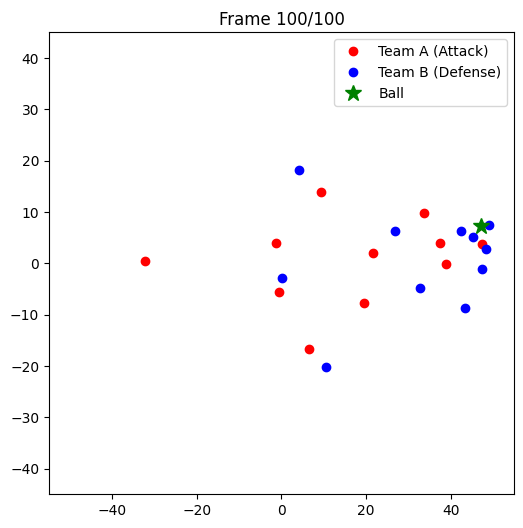

In [19]:
from IPython.display import HTML
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
# =========================================================
# (1) 한 배치 선택
# =========================================================
batch_idx = 780  # 시각화할 플레이 인덱스 (0 ~ batch_size-1)
gt = x_data[batch_idx]  # [horizon, feature_dim]
print(f"🎥 Visualizing play #{batch_idx} | shape = {gt.shape}")

# =========================================================
# (2) 기본 시각화 설정
# =========================================================
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-55, 55) 
ax.set_ylim(-45, 45)
ax.set_title("⚽ Synthetic Soccer Trajectories")

# 팀 색상 및 마커 설정
teamA_color = 'red'     # 공격팀
teamB_color = 'blue'    # 수비팀
ball_color = 'green'    # 공

attackers, = ax.plot([], [], 'o', color=teamA_color, label='Team A (Attack)')
defenders, = ax.plot([], [], 'o', color=teamB_color, label='Team B (Defense)')
ball, = ax.plot([], [], '*', color=ball_color, markersize=12, label='Ball')
ax.legend()

# =========================================================
# (3) 초기화 함수
# =========================================================
def init_anim():
    attackers.set_data([], [])
    defenders.set_data([], [])
    ball.set_data([], [])
    return attackers, defenders, ball

# =========================================================
# (4) 프레임 업데이트 함수
# =========================================================
def update_anim(frame):
    data = gt[frame].reshape(n_players, 2)

    teamA_xy = data[:n_teamA]
    teamB_xy = data[n_teamA:n_teamA + n_teamB]
    ball_xy = data[-1]

    # 좌표 설정 (x, y는 리스트로 전달해야 함)
    attackers.set_data(teamA_xy[:, 0], teamA_xy[:, 1])
    defenders.set_data(teamB_xy[:, 0], teamB_xy[:, 1])
    ball.set_data([ball_xy[0].item()], [ball_xy[1].item()]) 

    ax.set_title(f"Frame {frame + 1}/{horizon}")
    return attackers, defenders, ball

# =========================================================
# (5) 애니메이션 생성
# =========================================================
ani = FuncAnimation(fig, update_anim, frames=horizon,
                    init_func=init_anim, interval=150, blit=True)

HTML(ani.to_jshtml())